In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats

pd.set_option('display.max_rows', None)

In [3]:
df_wpm15= pd.read_csv('data/pct15.csv')
df_wpm60= pd.read_csv('data/pct60.csv')

In [35]:
def pltscat(df,dfx,dfy,dfs,dfc,note,clr):
    dfp=df.copy()
    sz=dfp[dfs]
    sz=sz.max()-sz
    sz=(sz.max()-sz)
    sz=(1000*(sz/sz.max())**1.5)+20
    plt.figure(figsize=(40, 17))
    plt.scatter(dfp[dfx],dfp[dfy],sz,c=dfp[dfc],cmap=clr,alpha=.25 )
    plt.gca().set_facecolor((.1, .1, .1, .80))
    cbar=plt.colorbar()
    cbar.set_label(dfc,fontsize=20)
    plt.ylabel(dfy,fontsize=20)
    plt.xlabel(dfx,fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    myx = df.loc[dfp['name'] == 'ZeroC00', dfx].values[0]
    myy = df.loc[dfp['name'] == 'ZeroC00', dfy].values[0]
    plt.axvline(myx, color='yellow', linestyle='--', alpha = .8,linewidth= 2,label='Me')
    plt.axhline(myy, color='yellow', linestyle='--', alpha = .8,linewidth= 2)
    plt.legend(facecolor=(.5, .5,.5, 0.95), edgecolor='black',fontsize=20)
    plt.figtext(
        x=0.53, y=.23,  # x=0.5 centers it, y=-0.1 places it below the x-axis
        s=note,
        fontsize=24, color="black", ha="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="gray")
    )
    plt.show

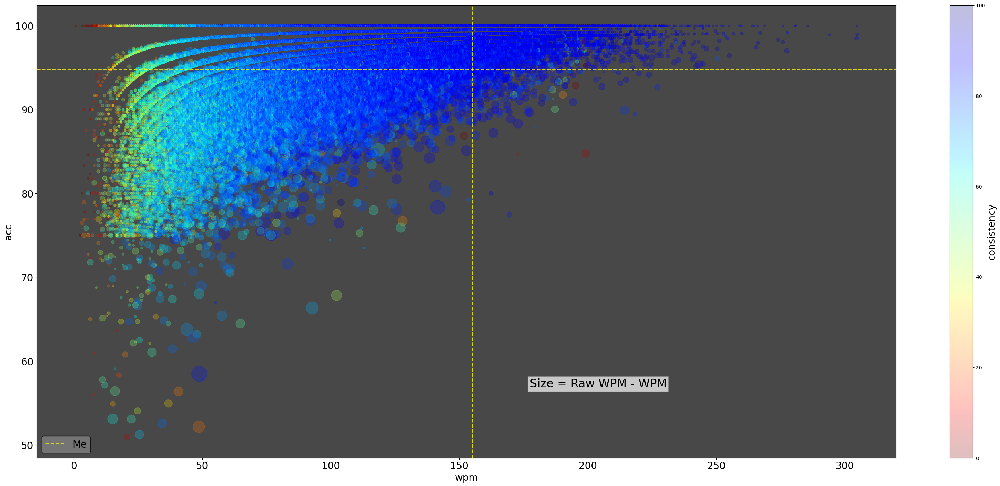

In [36]:
pltscat(df_wpm15,'wpm','acc','diff','consistency',"Size = Raw WPM - WPM",'jet_r')

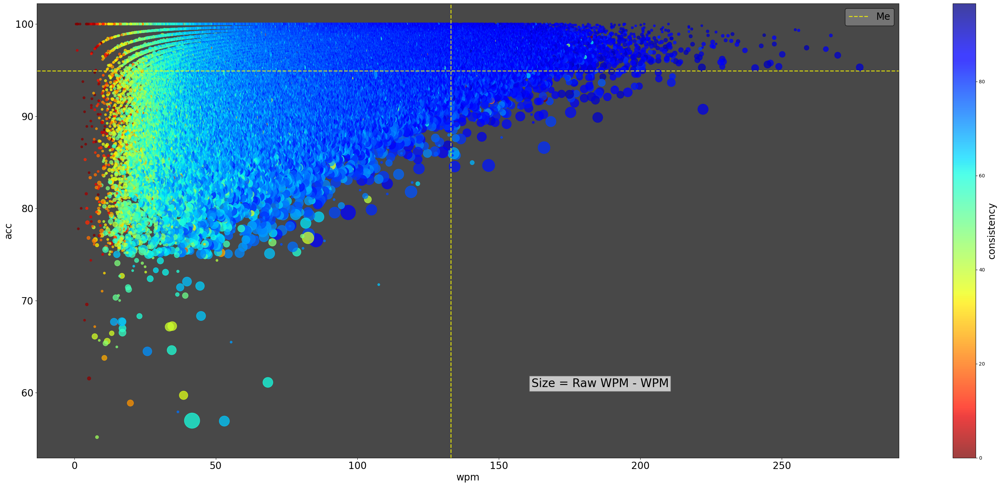

In [ ]:
pltscat(df_wpm60,'wpm','acc','diff','consistency',"Size = Raw WPM - WPM",'jet_r')

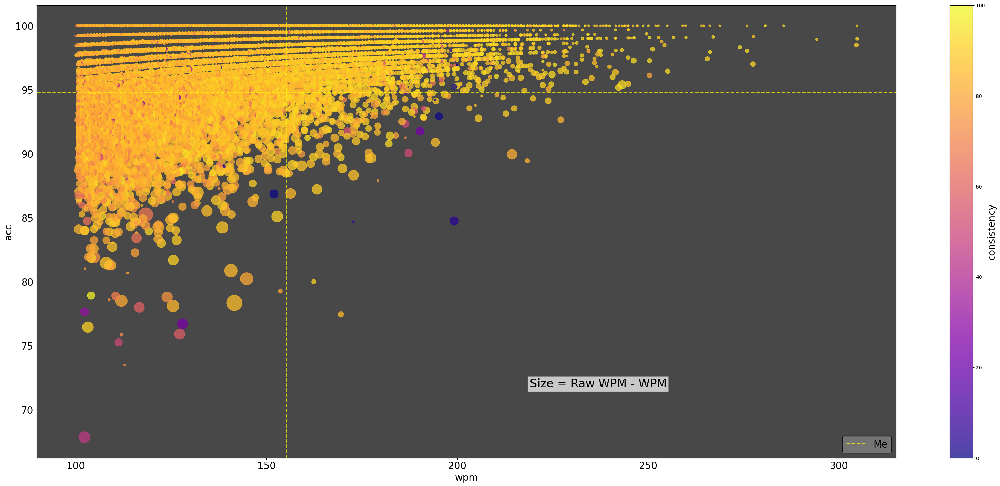

In [7]:
pltscat(df_wpm15.query("wpm > 100"),'wpm','acc','diff','consistency',"Size = Raw WPM - WPM",'plasma')

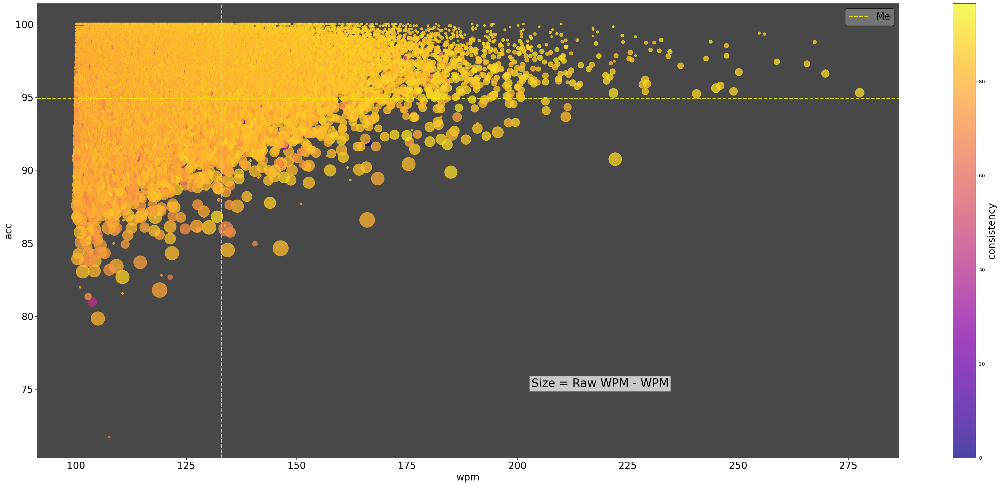

In [8]:
pltscat(df_wpm60.query("wpm > 100"),'wpm','acc','diff','consistency',"Size = Raw WPM - WPM",'plasma')

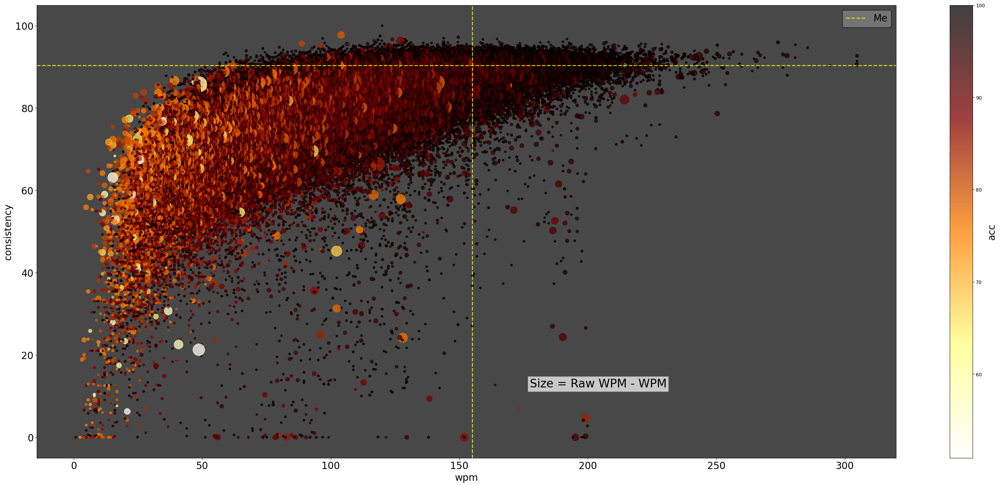

In [9]:
pltscat(df_wpm15,'wpm','consistency','diff','acc',"Size = Raw WPM - WPM",'afmhot_r')

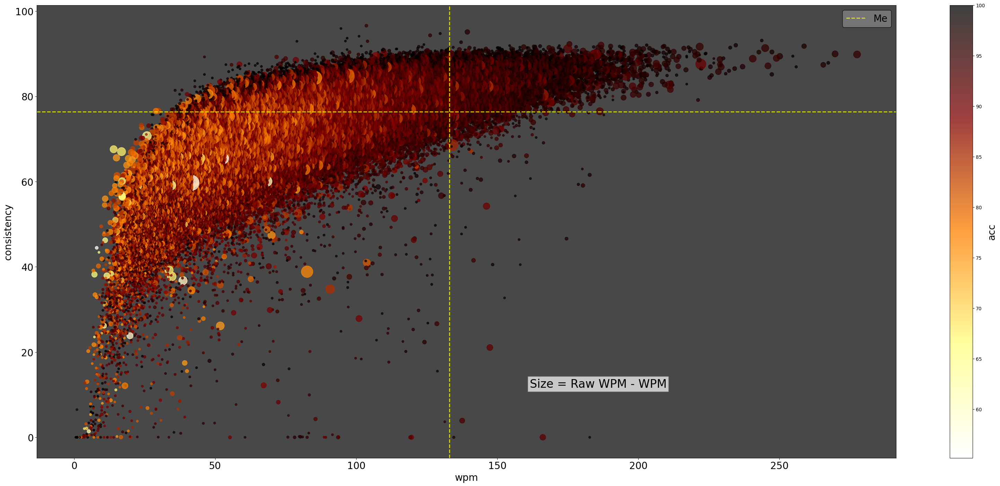

In [10]:
pltscat(df_wpm60,'wpm','consistency','diff','acc',"Size = Raw WPM - WPM",'afmhot_r')

In [11]:
def binnify(df,bincol,statcol,bin_size):
    dfp = df.copy()
    dfp['bin'] = pd.cut(dfp[bincol], bins=range(int(dfp[bincol].min()), int(dfp[bincol].max())+1+ bin_size, bin_size))

    # Define the statistics you want to calculate
    stats = {
        'mean': 'mean',
        'min': 'min',
        'max': 'max',
        'med': 'median',
        'cnt': 'count',
        'std': 'std'
    }                         
    
    # Initialize the merged DataFrame with the 'bin' column
    merged_df = dfp.groupby('bin', observed=False).size().reset_index().rename(columns={0: 'size'}).drop(columns=['size'])

    for stat_name, func in stats.items():
            stat_df = dfp.groupby('bin', observed=False)[statcol].agg(func).round(1).reset_index().rename(columns={statcol: stat_name})
            #print(f"Shape of {stat_name} DataFrame: {stat_df.shape}")  # Debugging line
            merged_df = merged_df.merge(stat_df, on='bin', how='left')
    merged_df['b'] = [int(interval.left) for interval in dfp['bin'].cat.categories]
    merged_df = merged_df[merged_df['cnt'] > 0]
    
    return merged_df.reset_index(drop=True)

In [12]:
def statbox(df,bincol,statcol,bin_size):
    
    dfp = df.copy()
    dfp['bin'] = pd.cut(dfp[bincol], bins=range(int(dfp[bincol].min()), int(dfp[bincol].max()) + bin_size, bin_size))
    merged_df = binnify(dfp,bincol,statcol,bin_size)
    xwidths = [(w / max(list(merged_df.cnt)))**.8 for w in list(merged_df.cnt)]

    plt.figure(figsize=(10, 6))
    box_plot = sns.boxplot(x='bin', y=statcol, data=dfp, width=xwidths)
    plt.title(f'Box plot of {statcol} by {bincol} with bin size {bin_size}')
    plt.xlabel(bincol)
    plt.ylabel(statcol)
    bin_labels = [f'{int(interval.left)}' for interval in dfp['bin'].cat.categories]

    ex=0
    if bin_size > 2:
        ex=bin_size-2
    
    less_labels = bin_labels[0:len(bin_labels):int((2+ex)/bin_size)]
    plt.xticks(ticks=range(0,len(bin_labels),int((2+ex)/bin_size)), labels=less_labels, rotation=90,fontsize = 6,fontweight='bold')
    
    myacc = int(dfp.loc[dfp['name'] == 'ZeroC00', bincol].values[0])
    minacc = int(dfp[bincol].min())
     
    myx= int(myacc-minacc)//bin_size
    myy = dfp.loc[df['name'] == 'ZeroC00', statcol].values[0]
    plt.axvline(myx, color='red', linestyle='--', alpha = .4,linewidth= 1,label='Me')
    plt.axhline(myy, color='red', linestyle='--', alpha = .4,linewidth= 1)
    
    plt.show()


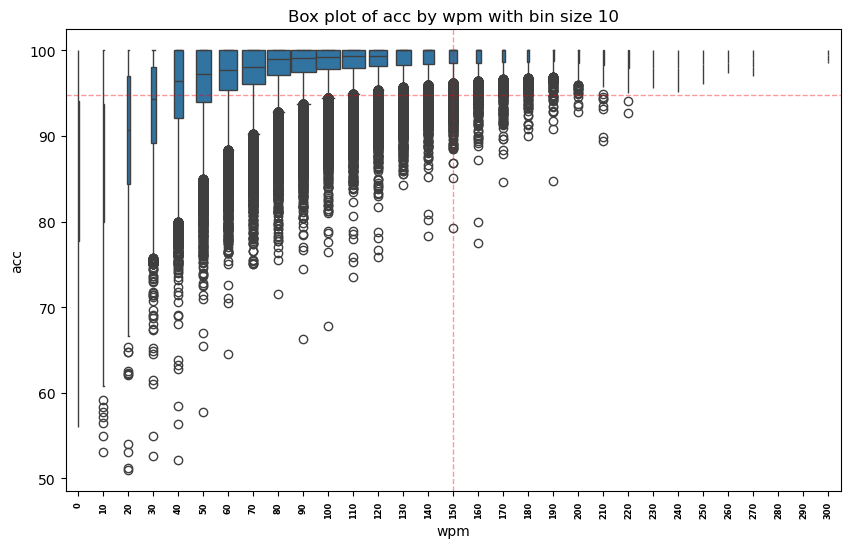

In [13]:
statbox(df_wpm15,'wpm','acc',10)

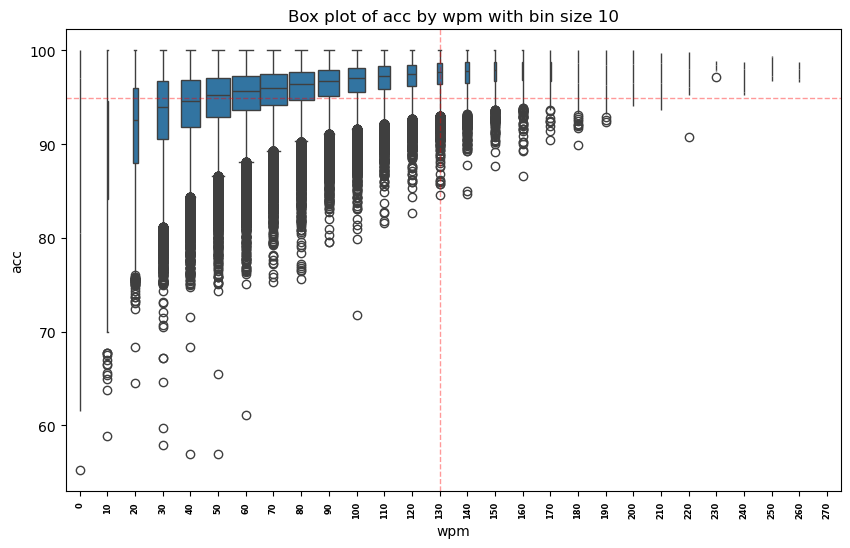

In [14]:
statbox(df_wpm60,'wpm','acc',10)

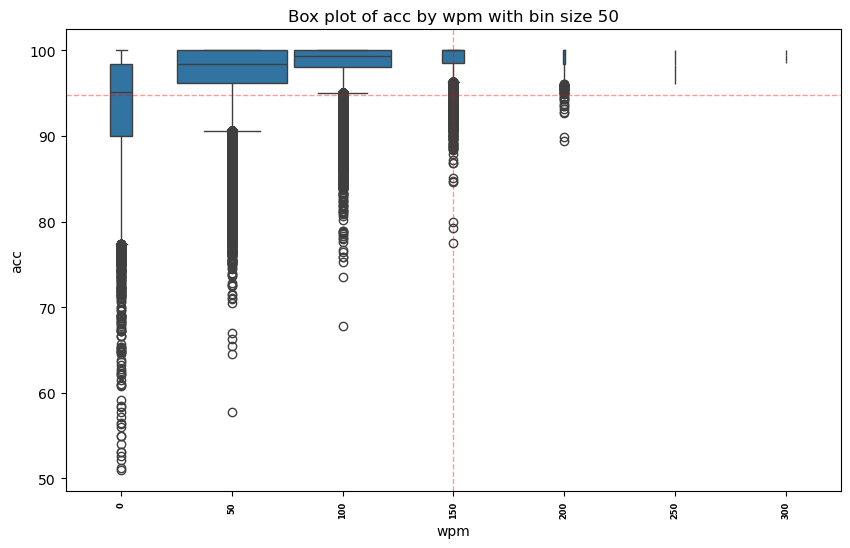

In [15]:
statbox(df_wpm15,'wpm','acc',50)

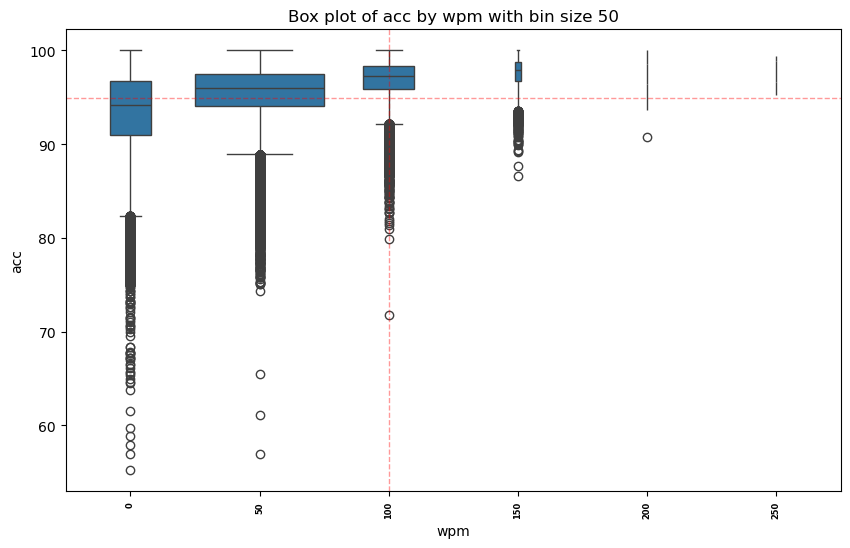

In [16]:
statbox(df_wpm60,'wpm','acc',50)

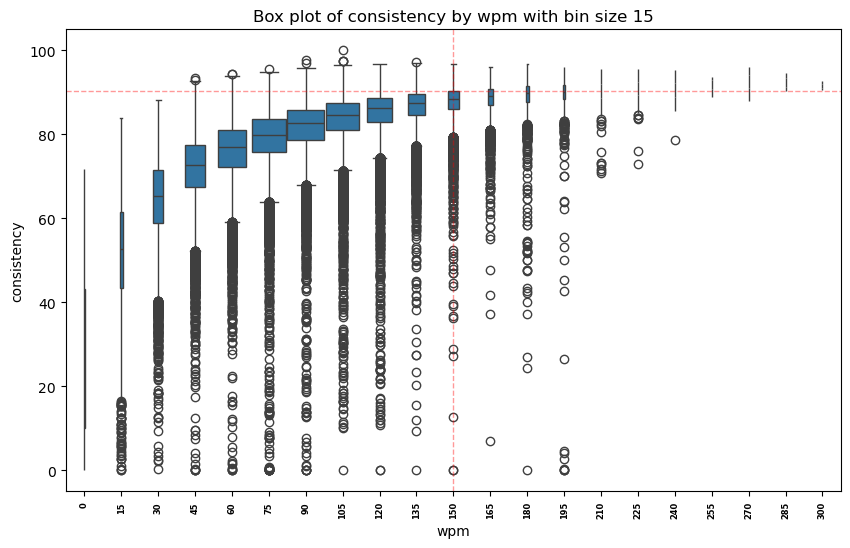

In [17]:
statbox(df_wpm15,'wpm','consistency',15)

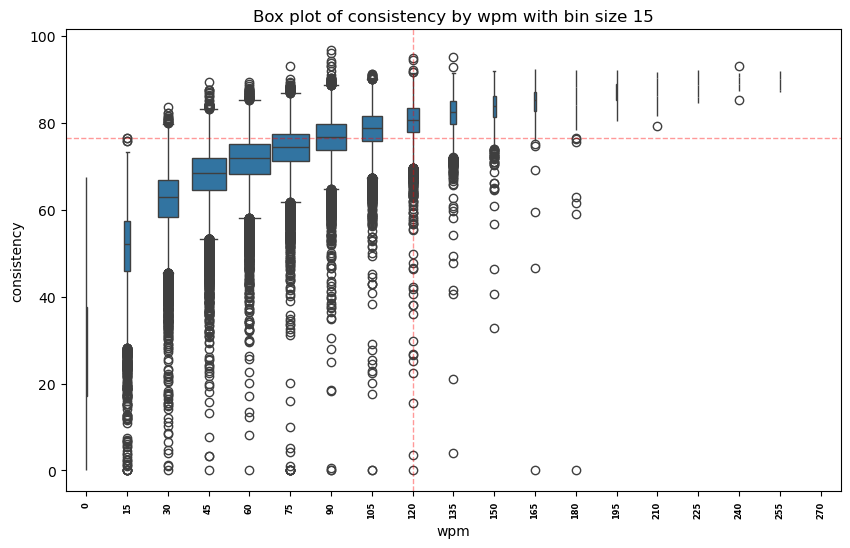

In [18]:
statbox(df_wpm60,'wpm','consistency',15)

In [19]:
df_wpm15['created'] = pd.to_datetime(df_wpm15['datetime'])-pd.to_datetime(df_wpm15['datetime']).min()
df_wpm15['created'] = df_wpm15['created'].dt.days

df_wpm60['created'] = pd.to_datetime(df_wpm60['datetime'])-pd.to_datetime(df_wpm60['datetime']).min()
df_wpm60['created'] = df_wpm60['created'].dt.days


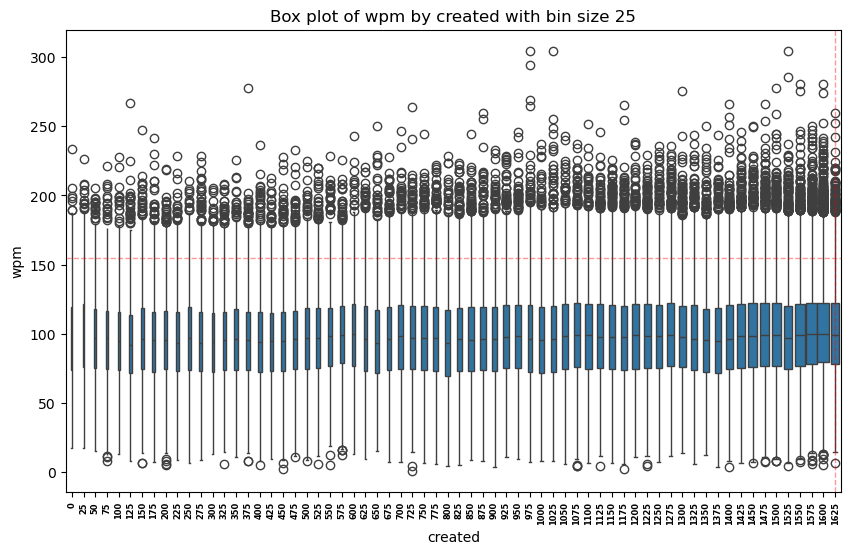

In [20]:
statbox(df_wpm15,'created','wpm',25)

In [21]:
def plothisto(df,statcol,b,filt=""):
    # Plot histogram
    print(f"int(df[statcol].max()-df[statcol].min()) = {(int(df[statcol].max()-df[statcol].min()))}")
    plt.figure(figsize=(10, 6))
    plt.gca().set_facecolor((0.0, .10, .10, 0.95))
    sns.histplot(df[statcol], bins=int(b*(df[statcol].max()-df[statcol].min())), color = '.8', kde=True)
    plt.title(f'Histogram of {statcol} {filt}')
    plt.xlabel(statcol)
    plt.ylabel('Frequency')

    # Calculate mean and standard deviation of the "accuracy" column
    mean_st= df[statcol].mean()
    std_dev_st = df[statcol].std()
    
    plt.axvline(mean_st, color='yellow', linestyle='-', linewidth=1, label='Mean')

    myval = df.loc[df['name'] == 'ZeroC00', statcol].values[0]
    plt.axvline(myval, color='lime', linestyle='-',linewidth=1, label='Me')

    mxdev = 5
    # Adding standard deviation lines
    for i in range(1, mxdev+1):
        plt.axvline(mean_st + i*std_dev_st, color='white',alpha=.8, linestyle=':',linewidth=.5*((mxdev+1)-i)**.48, label=f'{i}σ')
        plt.axvline(mean_st - i*std_dev_st, color='white',alpha=.8, linestyle=':',linewidth=.5*((mxdev+1)-i)**.48)


    plt.legend(facecolor=(.50, .41,.3, 0.15), edgecolor='black')

    

    # Set x-ticks to align with standard deviation thresholds
    std_devs = [mean_st + i*std_dev_st for i in range(-mxdev, mxdev+1)]
    plt.xticks(std_devs, [f'{mean_st + i*std_dev_st:.2f}' for i in range(-mxdev, mxdev+1)])
    plt.xlim(df[statcol].min()-2,df[statcol].max()+1)

    
    plt.show()

int(df[statcol].max()-df[statcol].min()) = 1638


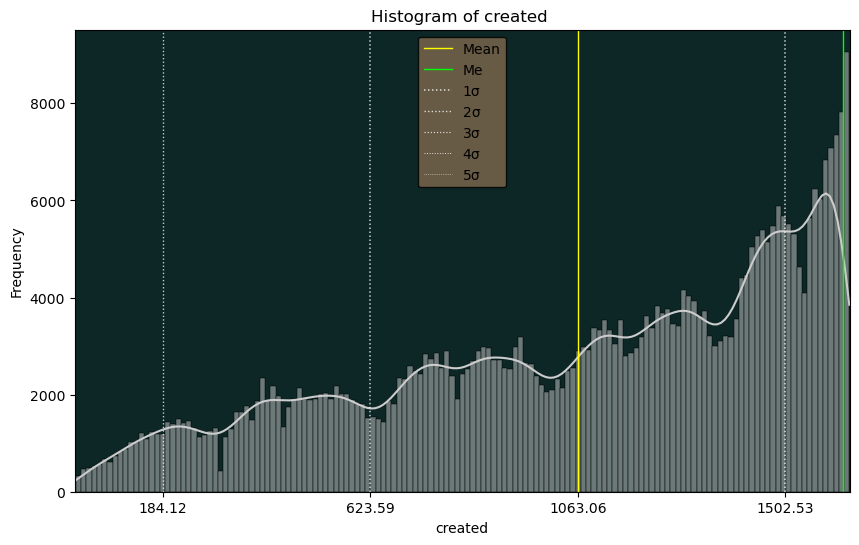

In [22]:
plothisto(df_wpm15,'created',.09)

int(df[statcol].max()-df[statcol].min()) = 1726


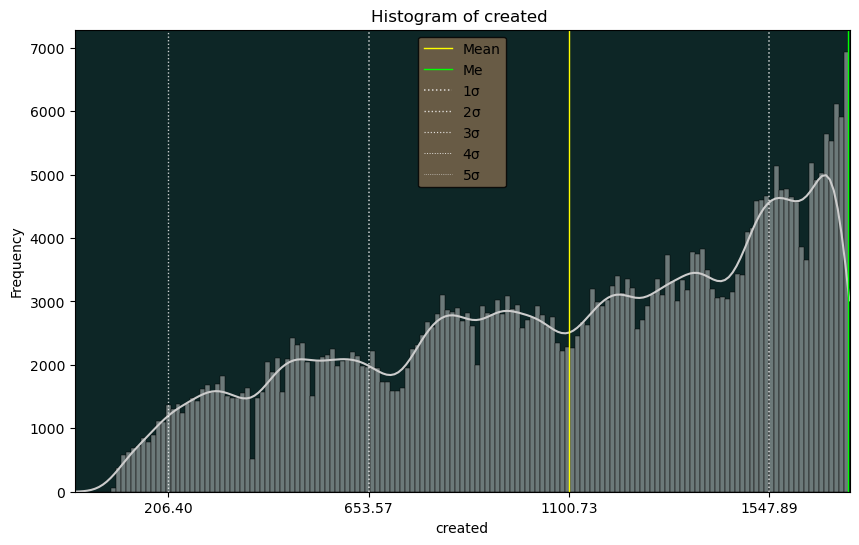

In [23]:
plothisto(df_wpm60,'created',.09)

int(df[statcol].max()-df[statcol].min()) = 303


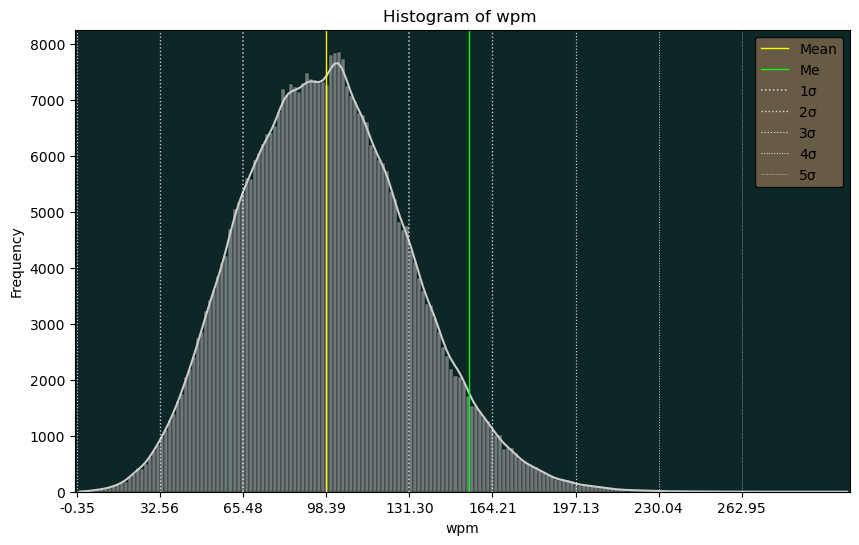

In [24]:
plothisto(df_wpm15,'wpm',.63)

int(df[statcol].max()-df[statcol].min()) = 276


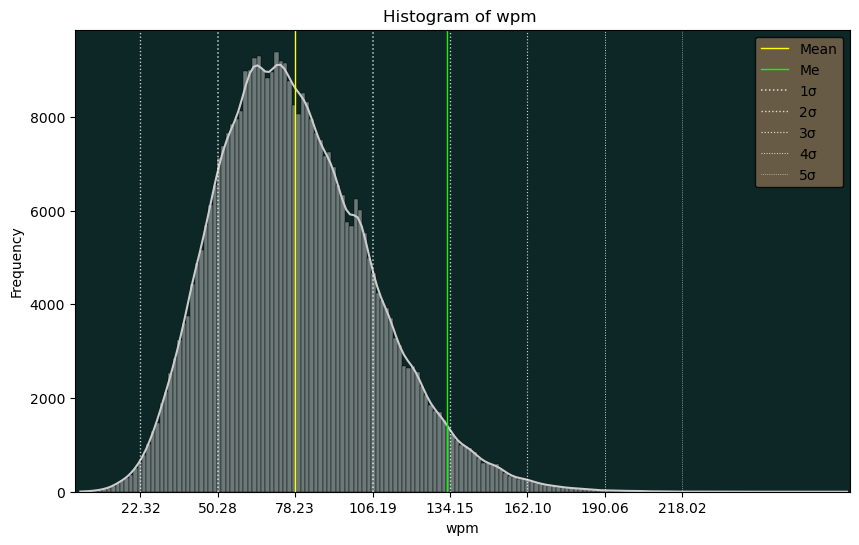

In [25]:
plothisto(df_wpm60,'wpm',.63)

int(df[statcol].max()-df[statcol].min()) = 49


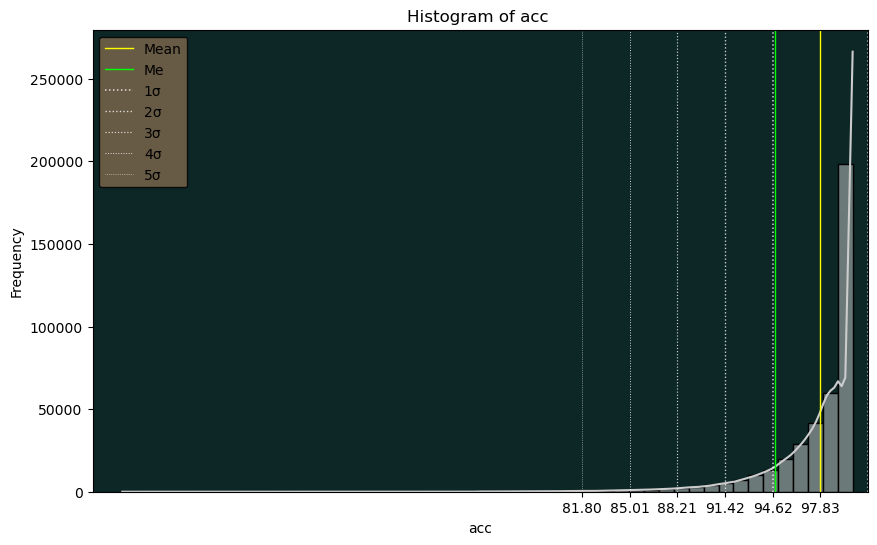

In [26]:
plothisto(df_wpm15,'acc',1)

int(df[statcol].max()-df[statcol].min()) = 44


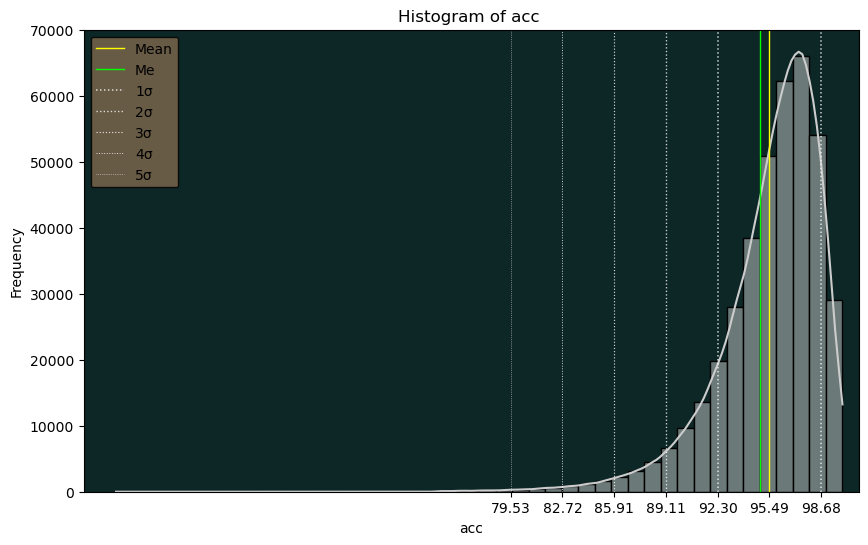

In [27]:
plothisto(df_wpm60,'acc',1)

int(df[statcol].max()-df[statcol].min()) = 100


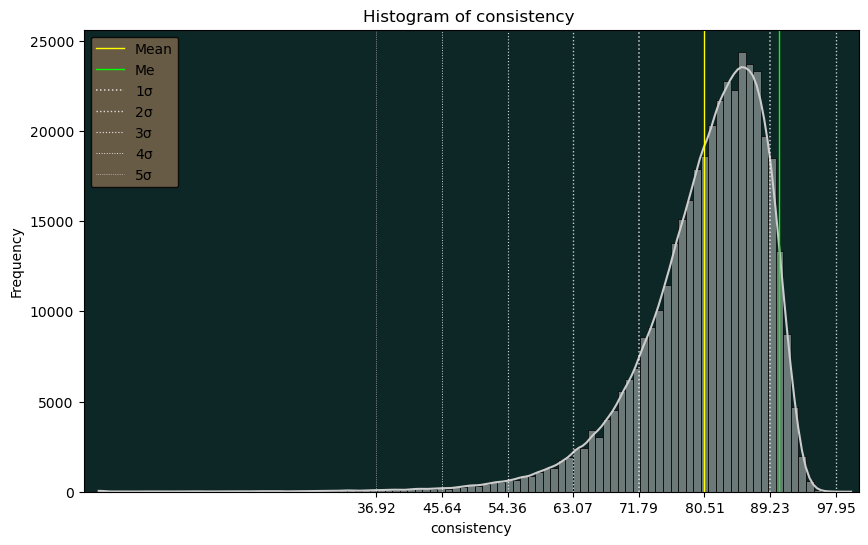

In [28]:
plothisto(df_wpm15,'consistency',1)

int(df[statcol].max()-df[statcol].min()) = 96


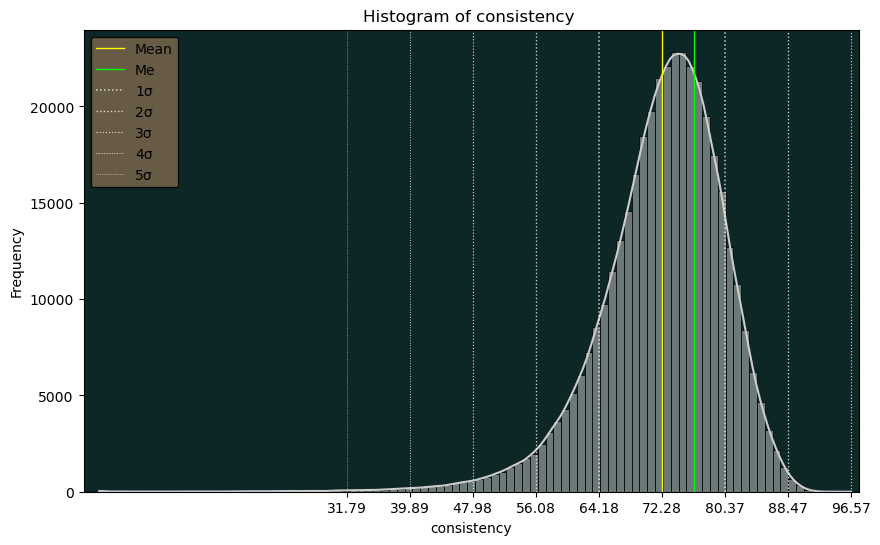

In [29]:
plothisto(df_wpm60,'consistency',1)

In [30]:
s15 = df_wpm15.copy()[['wpm']].sort_values('wpm')
s60 = df_wpm60.copy()[['wpm']].sort_values('wpm')

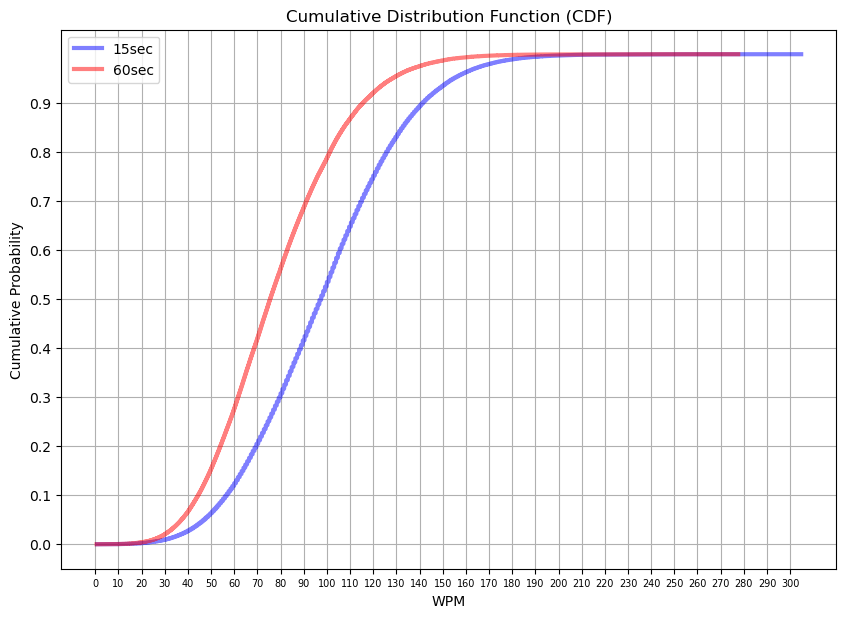

In [31]:
# Calculate the cumulative probabilities
cdf15 = np.arange(1, len(s15) + 1) / len(s15)
cdf60 = np.arange(1, len(s60) + 1) / len(s60)

# Plot the CDF
plt.figure(figsize=(10, 7))
plt.plot(s15.values, cdf15, label = "15sec", color='blue',linestyle='-',linewidth=3,alpha=.5)
plt.plot(s60.values, cdf60, label = "60sec", color='red', linestyle='-',linewidth=3,alpha=.5)
plt.xticks(ticks=range(0, 310,10), fontsize=7)
plt.yticks(ticks=[x*.1 for x in range(0,10)], fontsize=10)
plt.title("Cumulative Distribution Function (CDF)")
plt.xlabel("WPM")
plt.ylabel("Cumulative Probability")
plt.legend()
plt.grid()
plt.show()

In [32]:
df_comp=df_wpm15.copy()[['wpm']]
df_comp['mode'] = 15
df_comp2=df_wpm60.copy()[['wpm']]
df_comp2['mode'] = 60
df_comp=pd.concat([df_comp,df_comp2],ignore_index=True)

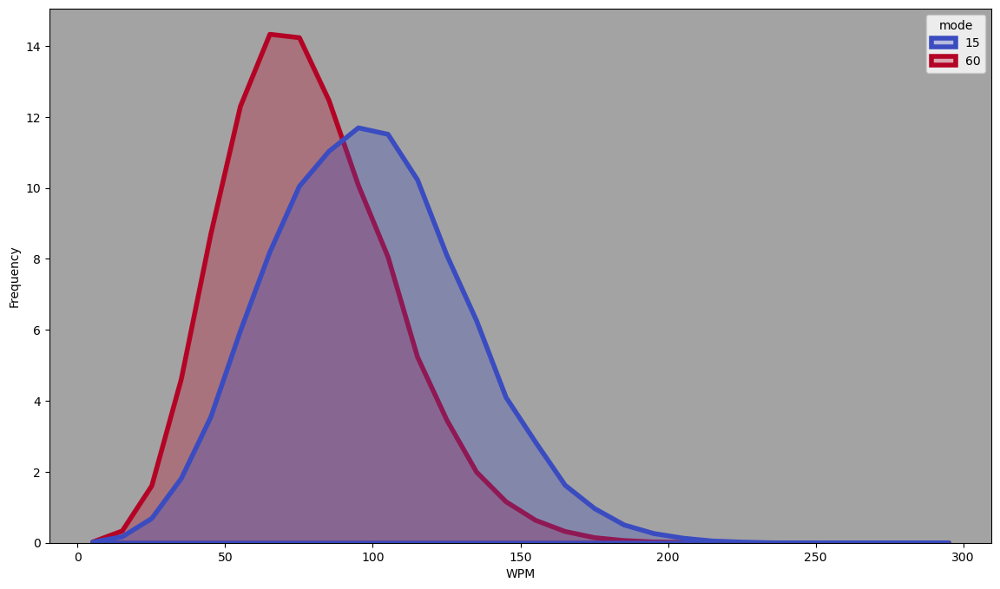

In [33]:
fig, ax = plt.subplots(figsize=(14, 8))
HIST_BINS = [x for x in range(0,305,10)]
p = sns.histplot(x="wpm",data=df_comp,palette='coolwarm',hue="mode",bins=HIST_BINS,stat="percent",alpha=.3,kde=False,\
             common_norm=False,discrete=False,common_bins=False,fill=True,element='poly',multiple='layer',linewidth=4)
p.set_facecolor((.1, .1, .1, .40))
p.set_xlabel("WPM",fontsize=10)
p.set_ylabel("Frequency",fontsize=10)
plt.show()

In [34]:
df_compare = pd.read_csv('wpmtab.csv').describe().round(2)

FileNotFoundError: [Errno 2] No such file or directory: 'wpmtab.csv'

In [ ]:
df_compare.wpm15-df_compare.wpm60

count     0.00
mean     20.24
std       4.65
min       4.17
25%      16.69
50%      21.96
75%      24.10
max      27.19
dtype: float64

In [ ]:
df_compare.wpm15/df_compare.wpm60

count    1.000000
mean     1.255879
std      1.151515
min      1.194951
25%      1.286327
50%      1.290515
75%      1.250859
max      1.097957
dtype: float64

In [ ]:
df_conv=pd.read_csv('wpmtab.csv')

In [ ]:
def convert(w,dir="up"):
    if dir == 'up':
        w2 = (df_conv.query("wpm60 <= @w").mult.max())*w
        print(f"A 60sec rate of {w} WPM predicts a 15sec rate of {w2:.2f} WPM")
    else:
        w2 = (1/(df_conv.query("wpm60 <= @w").mult.max()))*w
        print(f"A 15sec rate of {w} WPM predicts a 60sec rate of {w2:.2f} WPM")
    

In [ ]:
convert(132.99,"up")

A 60sec rate of 132.99 WPM predicts a 15sec rate of 172.66 WPM


In [ ]:
convert(155.1,"down")

A 15sec rate of 155.1 WPM predicts a 60sec rate of 119.46 WPM


In [ ]:
df_wpm60[np.isnan(df_wpm60.consistency)]

,rank,name,wpm,raw,acc,consistency,datetime,diff,wpmpct,rawpct,accpct,consistencypct,diffpct,datetimepct,delta,deltapct,created
186,187,kogasa,196.25,205.39,95.81,NaN,2020-07-16 00:35:06.729,9.14,0.047176,0.051234,55.21016,99.99975,7.246847,99.99975,-55.16299,95.62556,0
